In [1]:
# data analytics
import pandas as pd
import numpy as np
from scipy.stats.mstats import winsorize
from scipy.stats import skew, skewtest

# viz
import matplotlib.pyplot as plt
import seaborn as sns
from haversine import haversine

# geoviz
from branca.element import Figure
import folium
from folium.plugins import FastMarkerCluster
import geohash as gh
from geopy.geocoders import Nominatim

# ML
from catboost import CatBoostRegressor
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from pycaret.regression import * # import all as suggested by the documentation

# others
from tqdm import tqdm
from utils import analyze_numeric_var, filter_numeric_var, coord_to_addr, manhattan, analyze_trip_group, mean_error, visualize_trips

# warnings
pd.options.mode.chained_assignment = None 
from warnings import simplefilter
simplefilter(action='ignore', category=FutureWarning)

# Problem Statement

This exercise focuses on deriving values and training machine learning models from the famous NYC taxi dataset. Specifically, I used a portion of the dataset to achieve the following goals:

1. Logically categorizing the individual trips into groups and performing statistical analyses on these trip groups
2. Training and evaluating fare prediction and tip prediction models
3. Recommending ways for taxi drivers and owners to optimize their earnings

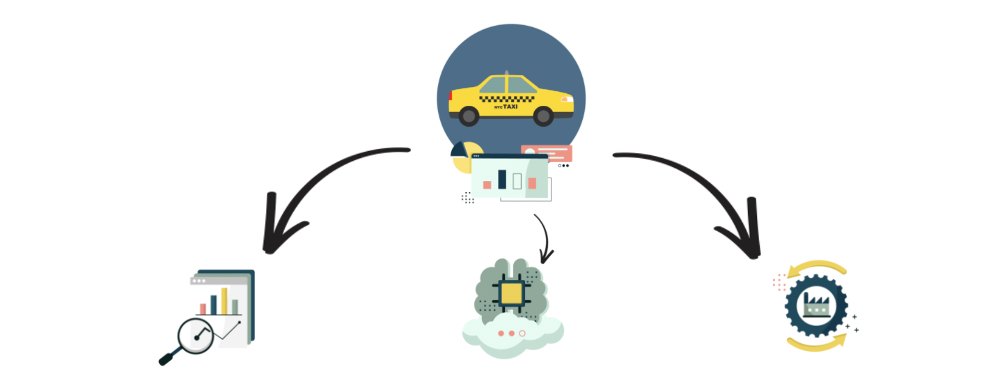

The following is the main sections of this notebook:

**1. Data description, EDA and feature engineering**

In this section, I retrieved the data and explored and analyzed its most important features (columns). I grouped these columns into three categories: 
- location-related columns,
- time-related columns, and
- fare-related columns


Concurrent to this exploration, I also engineered new features that could be useful for the subsequent modeling steps. In addition, I filtered out rows whose entries seemed erroneous or irrelevant for subsequent steps.


**2. Trip analysis**

This section aims to answer the following question:

<font size="2" color = "green">*In which trip groups can you use the groups' mean values as measures of central tendency to estimate fare and duration?*</font>

It is in this section that I categorized the unique trips into "trip groups" and performed statistical analyses on each group to investigate whether or not it is appriate to use the group's mean values as measures of central tendency for fare and duration estimation.


**3. Modeling**


This section aims to answer the following question:

<font size="2" color = "green">*Can we build a model to predict fare and tip amount given pick up and drop off coordinates, time of day and week?*</font>

In this section, I used the features engineered in section 1 to train fare and tip prediction models and analyzed the performance of the models.


**4. Optimization**

In this section, I used the analysis done in section 1 and performed additional analyses to recommend ways NYC taxi drivers and owners to optimize their earnings. Specifically, the following questions will be answered:


- <font size="2" color = "green">*If you were a taxi owner, how would you maximize your earnings in a day?*</font>

- <font size="2" color = "green">*If you were a taxi owner, how would you minimize your work time while retaining the average wages earned by a typical taxi in the dataset?*</font>

- <font size="2" color = "green">*If you run a taxi company with 10 taxis, how would you maximize your earnings?*</font>



# 1. Data retrieval, EDA and feature engineering

## Section summary 

In this section, I retrieved the data from BigQuery and split it into train and test sets.

I only performed the exploration step on the train set, during which I analyzed its most important features (columns). 

I grouped these columns into three categories: location-related columns, time-related columns and fare-related columns, and performed the analysis sequentially for each category.

Concurrent to this exploration, I also created new columns that either aid the analysis or could be useful for the subsequent modeling steps. The resulting columns, both original and newly engineered, fall into one of three categories: 

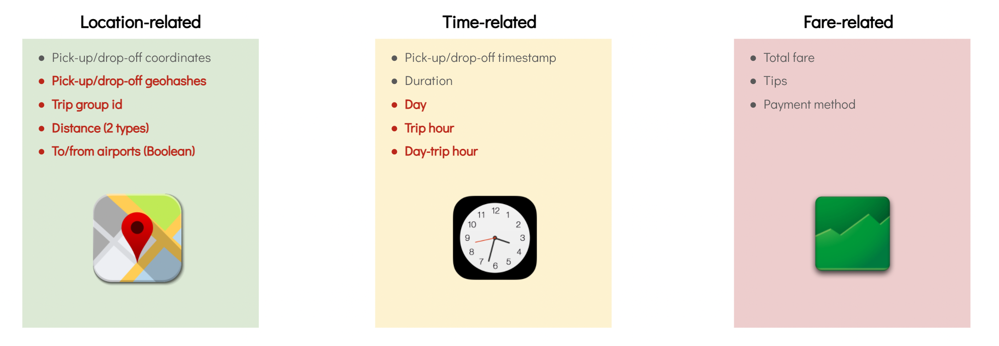


In addition, I filtered out rows whose entries seemed erroneous or irrelevant for subsequent steps.

**Location-related observations and actions**: 
- The majority of the trips start and end in NYC proper. I retricted the coordinates to lie within the boundaries of the greater NYC and its 2 major airports (La Guardia and JFK).
- I used geohashes to bin the starting and ending coordinates in a rectangular area of size ~600 m x 900 m, and created two additional features, `start_gh` and `end_gh` in the process.
- I assigned each trip into different "trip groups", which is a collection of trips between a specific geohash pairs. I expect that trips within a trip group exhibit some similarity in terms of distance and fare.
- I calculated the `haversine_distance` and the `manhattan_distance` between the pick-up and drop-off points. The mean trip distance calculated using these metrics is around 2 miles, but is much higher for airport trips.
- I removed trips with distance of 0 mile.

**Time-related observations and actions**: 

- I removed trips with a duration of 0 minute
- I investigated how trips are distributed throughout the week and throughout the day. I discovered that most taxi trips take place in the busy hours in the evening.


**Fare-related observations and actions**: 
- I discovered that passangers overwhelmingly pay by either credit card or cash. I removed trips whose payment type is anything but `Cash` or `Credit Card` as there are very few of them.
- The majority of trips paid by cash do not involve tips; this might be due to the tipping not being recorded by the cab driver (e.g. to avoid tax). As such, I will exclude rows with cash payment in any future steps that involve the analysis or prediction of tips.


## A. Data Retrieval

I was provided with two csv files: `trip_data.csv` and `trip_data.csv`. I uploaded them as BigQuery tables: `data` and `fare`. Being a cloud data warehouse, BigQuery enables efficient querying and analysis of large datasets like this one.

Within BigQuery, I joined these two tables on the following columns:

- `medallion`: a transferable permit which identifies a unique vehicle
- `_hack_license`: a driver's permit which identifies a unique driver
- `_pickup_datetime`: given a unique combination of medallion and hack license, a pickup time represents a unique taxi trip
    
I selected the most important columns related to the locations, timing and the fees of each trip and randomly sampled around 30,000 rows out of the resulting merged table. 

Finally, I retrieved the query result as a Pandas DataFrame `df`. Each row in df corresponds to a unique taxi trip.


In [2]:
QUERY = """

SELECT data.medallion vehicle_id, 
       data._hack_license driver_id,
       
       data._pickup_datetime start_time,
       data._dropoff_datetime end_time,
       data._trip_time_in_secs duration,
       data._pickup_longitude start_long,
       data._pickup_latitude start_lat,
       data._dropoff_longitude end_long,
       data._dropoff_latitude end_lat,
       data._trip_distance distance,
       
       data._rate_code rate_code,
       fare._total_amount fare,
       fare._tip_amount tip,
       fare._payment_type payment_type
       
       
FROM `meraldo-antonio-sandbox.nyc.trip_data` data
    INNER JOIN `meraldo-antonio-sandbox.nyc.trip_fare` fare
    ON (data.medallion = fare.medallion AND 
        data._pickup_datetime = fare._pickup_datetime AND
        data._hack_license = fare._hack_license)   
    

WHERE MOD(ABS(FARM_FINGERPRINT(CONCAT(data.medallion, data._hack_license, data._pickup_datetime))), 1000) < 2
"""

df = pd.read_gbq(QUERY)

In [3]:
print(f"Original shape of the dataframe: {df.shape}")

Original shape of the dataframe: (29726, 14)


In [4]:
df.isna().sum()

vehicle_id      0
driver_id       0
start_time      0
end_time        0
duration        0
start_long      0
start_lat       0
end_long        0
end_lat         0
distance        0
rate_code       0
fare            0
tip             0
payment_type    0
dtype: int64

Let's now drop any rows with missing values.

In [5]:
df.dropna(inplace = True)
print(f"Shape of the dataframe after dropping rows with missing values: {df.shape}")

Shape of the dataframe after dropping rows with missing values: (29726, 14)


Some of the downstream tasks involve model training, which in turn necessitates EDA steps.

Before performing EDA, it's a good practice to first split the data into training/validation set and testing set and only perform the EDA on the training/validation set, so as to avoid any data leakage.

Through the code below, I set aside the 10% of the data as the test set. 

I will perform EDA and model training only on the remaining 90% (the train set).

In [6]:
df, test_df = train_test_split(df, test_size = 0.1, random_state=123)

In [7]:
print(f"Shape of the train/validation set: {df.shape}")

Shape of the train/validation set: (26753, 14)


## B. EDA and feature engineering: location-related columns

### Pick-up and drop-off points

First, let's visualize the geographical distribution of the pick-up and drop-off points (for now, we'll treat these two groups together).

I'm interested to see the how many of these points lie within the boundary of greater NYC. I defined this boundary to include NYC proper and its two main airports - John F. Kennedy (JFK) and LaGuardia.

In [8]:
NYC_LAT_LIMITS = (40.62, 40.87)
NYC_LONG_LIMITS = (-74.04, -73.75)

JFK_COORD = (40.65, -73.79)
LAGUARDIA_COORD = (40.7769, -73.8740)

In [9]:
fig=Figure(width=1000,height=600)

# main map
m = folium.Map(
    location=[(NYC_LAT_LIMITS[0] + NYC_LAT_LIMITS[1])/2, (NYC_LONG_LIMITS[0] + NYC_LONG_LIMITS[1])/2],
    zoom_start=11,
    zoom_control=True,
    scrollWheelZoom=False,
    dragging=False
)

# add NYC bound
bounds = [(NYC_LAT_LIMITS[0], NYC_LONG_LIMITS[0]),
          (NYC_LAT_LIMITS[1], NYC_LONG_LIMITS[0]),
          (NYC_LAT_LIMITS[0], NYC_LONG_LIMITS[1]),
          (NYC_LAT_LIMITS[1], NYC_LONG_LIMITS[1])]
folium.Rectangle(bounds=bounds, color="#572a27", fill=True, fill_color="#f2e1f1", fill_opacity=0.5).add_to(m)

# add cluster points
coordinate_list = df[["start_lat", "start_long"]].values.tolist() + df[["end_lat", "end_long"]].values.tolist() 
m.add_child(FastMarkerCluster(coordinate_list))

# add LaGuardia in black
folium.Marker(popup = "La Guardia", location=[LAGUARDIA_COORD[0], LAGUARDIA_COORD[1]], icon=folium.Icon(color='black', icon='plane', prefix='fa')).add_to(m)

# add JFK in red
folium.Marker(popup = "JFK", location=[JFK_COORD[0], JFK_COORD[1]], icon=folium.Icon(color='red', icon='plane', prefix='fa')).add_to(m)

fig.add_child(m)

We see above that there some trips that either originate from or end in places that fall outside of this boundary. Let's filter out these trips.

In [10]:
df = df.loc[(df.start_lat >= NYC_LAT_LIMITS[0]) & (df.start_lat <= NYC_LAT_LIMITS[1])]
df = df.loc[(df.end_lat >= NYC_LAT_LIMITS[0]) & (df.end_lat <= NYC_LAT_LIMITS[1])]
df = df.loc[(df.start_long >= NYC_LONG_LIMITS[0]) & (df.start_long <= NYC_LONG_LIMITS[1])]
df = df.loc[(df.end_long >= NYC_LONG_LIMITS[0]) & (df.end_long <= NYC_LONG_LIMITS[1])]
print(f"Shape of the dataframe after filtering out out-of-bound data points: {df.shape}")

Shape of the dataframe after filtering out out-of-bound data points: (26133, 14)


### Airport trips

Trips to the airports might have distrinct fare and tip distributions then non-airport trips.

As such, here, I will engineer new Boolean features called `involve_jfk` and `involve_laguardia` which indicates whether or not a person is travelling to or from the JFK/La Guardia airports. 

The values of these features will be `True` if the *haversine* distance between the pick-up/drop-off points of a trip fall under a preset radius from either of the two airports.

In [11]:
MAX_DISTANCE_METER = 3000 # max distance from the midpoint of the JFK airport in meters (JFK is huge so the radius is big)
max_distance_mile = MAX_DISTANCE_METER * 0.000621371

MAX_DISTANCE_METER_LAGUARDIA = 1500 # max distance from the midpoint of the La Guardia airport in meters 
max_distance_mile_laguardia = MAX_DISTANCE_METER_LAGUARDIA * 0.000621371



In [12]:
df["include_JFK"] = df.apply(lambda x: 
                             (haversine((x.start_lat, x.start_long), JFK_COORD) <= max_distance_mile) or 
                             (haversine(JFK_COORD, (x.end_lat, x.end_long)) <= max_distance_mile), axis = 1)

df["include_laguardia"] = df.apply(lambda x: 
                             (haversine((x.start_lat, x.start_long), LAGUARDIA_COORD) <= max_distance_mile_laguardia) or 
                             (haversine(LAGUARDIA_COORD, (x.end_lat, x.end_long)) <= max_distance_mile_laguardia), axis = 1)


Let's take a look at some trips whose value for `include_laguardia` is `True`.

In [ ]:

fig=Figure(width=1000,height=600)
m = folium.Map(
    location=LAGUARDIA_COORD,
    zoom_start=12,
    zoom_control=False,
    scrollWheelZoom=False,
    dragging=False

)


folium.Circle([LAGUARDIA_COORD[0], LAGUARDIA_COORD[1]],
              radius=MAX_DISTANCE_METER_LAGUARDIA, 
              color="#572a27", 
              fill=True, 
              fill_color="#f2e1f1", 
              fill_opacity=0.5
                   ).add_to(m)



#add lines
TOP_N = 5
for idx, row in df[df["include_laguardia"] == True].head(TOP_N).iterrows():
    start_addr = coord_to_addr((row["start_lat"],row["start_long"] ))
    end_addr = coord_to_addr((row["end_lat"],row["end_long"] ))
    points = [(row["start_lat"],row["start_long"] ), (row["end_lat"],row["end_long"] )]
    folium.PolyLine(points, 
                    weight=2, 
                    opacity=1, 
                    tooltip = str(idx) + ") " + start_addr + " -- " + end_addr).add_to(m)


fig.add_child(m)



### Binning pick-up and drop-off points with geohashing

For the subsequent sections, it will be useful to group together these pick-up and drop-off points in a logical way. To that end, I used [geohashes](https://en.wikipedia.org/wiki/Geohash). 

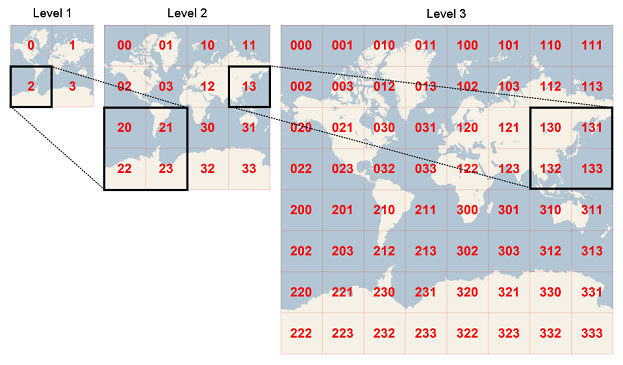

Geohashes refer to a hierarchical spatial data structure which subdivides the earth's surface into grids. The size of the grid is adjustable: longer geohashes (i.e. those whose string representations contain more characters) are associated with finer grids.

I used geohashes with a precision of 6, which corresponds to a grid with a height of ~600 m and longitudinal length of ~ 900 m. Such a grid would include around 20 blocks in Manhattan and roughly correspond to a small neighborhood in NYC (e.g. SoHo). At any given time, the local traffic condition within this grid can be assumed to be uniform.


Let's visualize an example of such geohash:


In [ ]:
GEOHASH_EXAMPLE = "dr5ru7" # an example geohash with precision 6 corresponding to central Manhattan
gh_limits = gh.bbox(GEOHASH_EXAMPLE ) 
bounds = [(gh_limits["n"], gh_limits["w"]),
          (gh_limits["s"], gh_limits["w"]),
          (gh_limits["n"], gh_limits["e"]),
          (gh_limits["s"], gh_limits["e"])]

print(f"Dimension of the geohash `{GEOHASH_EXAMPLE}`")
print(f'Longitudinal length : {haversine((gh_limits["s"], gh_limits["e"]), (gh_limits["s"], gh_limits["w"])) :.3} km')
print(f'Height : {haversine((gh_limits["n"], gh_limits["w"]), (gh_limits["s"], gh_limits["w"])) :.3} km')

In [ ]:
# main map
fig=Figure(width=1000,height=600)
m = folium.Map(
    location=[(gh_limits["n"] + gh_limits["s"])/2, (gh_limits["w"] + gh_limits["e"])/2],
    zoom_start=15,
    zoom_control=False,
    scrollWheelZoom=False,
    dragging=False

)

folium.Rectangle(bounds=bounds, color="#572a27", fill=True, fill_color="#f2e1f1", fill_opacity=0.5).add_to(m)
fig.add_child(m)


Let's now find the geohashes corresponding to the pick-up and drop-off locations in the dataset. These geohashes are termed `start_gh` and `end_gh`, respectively. 

In [ ]:
GH_PRECISION = 6 
df["start_gh"] = df.apply(lambda x: gh.encode(x.start_lat, x.start_long, precision = GH_PRECISION), axis = 1)
df["end_gh"] = df.apply(lambda x: gh.encode(x.end_lat, x.end_long, precision = GH_PRECISION), axis = 1)

The following is the total number of unique geohashes in the dataset:

In [ ]:
pd.concat([df["start_gh"], df["end_gh"]], axis = 0).nunique()

### Trip groups

Using this geohashes, we can logically group the trips together.

A "trip group" is a collection of trips that share the same origin geohash and ending geohash (the starting and ending geohashes can be the same for short trips). I expect that the trips within each trip group to show some similarity in terms of distance and fare.

We will now engineer another column, `trip_group_id`, that identifies the trip group to which a trip belong. We will use this `trip_group_id` column extensively in section 2.

In [ ]:
df["trip_group_id"] = df.apply(lambda x: tuple(sorted(tuple({x.start_gh, x.end_gh}))) if x.start_gh != x.end_gh else (x.start_gh, x.end_gh)
                                                                , axis = 1)

# string equivalent as tuples are not hashable
df["trip_group_id_str"] = df.apply(lambda x: str(x["trip_group_id"][1:-1]), axis = 1)

The following is the total number of `trip_group_id`'s in the dataset.

In [ ]:
df["trip_group_id"].nunique()

Below, I visualize an example trip group, which is the most common group that connects the area surrounding Grand Central and the area surrounding Penn Station.

In [ ]:
GEOHASH_START = "dr5rud" # an example start geohash 
GEOHASH_END = "dr5ru6" # an example end geohash
fig = visualize_trips(GEOHASH_START, GEOHASH_END, df)
fig

### Distance

The dataset contains a variable called `distance`; however, it is rather unclear what exact distance this refers to.

The variable's name suggests that it refers to the real distance recorded by the taxi's odometer in each trip; however, we'll see in a bit that this proposed definition might not be correct.

In any case, let's now investigate the distribution of the `distance` variable.

In [ ]:
analyze_numeric_var(var = "distance", 
                    df = df, 
                    binwidth = 0.1,
                    var_unit = "mile")

Notwithstanding the true definition of this `distance` variable, do note that it cannot be used as a predictor in the modeling step (section 3), in which only features **directly derived** from pick-up/drop-off locations are permitted.

As such, we will need to approximate the distance covered in each trip by engineering new "distance" features. Here are some ideas as to what distance features can be created:
  1. Haversine distance: a metric that represents the shortest distance between two points on a sphere using their latitudes and longitudes
  2. Manhattan distance: a metric that measures the distance between two points measured along axes at right angles
  3. Real-world driving distance: a driving distance that results from using third-party sources (e.g. Google Maps API) to approximate real-world driving distance between two addresses.
  
The diagram below shows how these three distance metrics look like for a trip between central Manhattan and JFK.


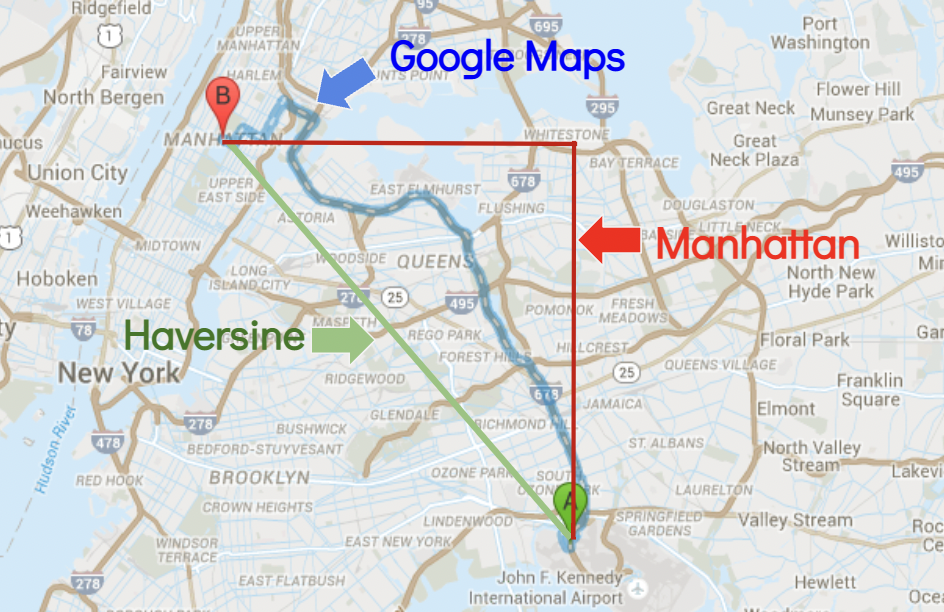



In this exercise, I will engineer and analyze the Haversine and Manhattan distances. Real-world driving distance will not be used because unfortunately, engineering this feature (e.g. by invoking the Google Maps API) might incur some cost. However, in real-world application, this third metric might prove to be the most accurate.


In [ ]:
df["haversine_distance"] = df.apply(lambda x: haversine((x.start_lat, x.start_long), (x.end_lat, x.end_long)), axis = 1)
df["manhattan_distance"] = df.apply(lambda x: manhattan((x.start_lat, x.start_long), (x.end_lat, x.end_long)), axis = 1)

Here, we see how the original `distance` variable compares with the newly engineered `haversine_distance` and `manhattan_distance`.

In [ ]:
df[["distance", "haversine_distance", "manhattan_distance"]].head()

Surprisingly the original `distance` variable consistently exceeds the `haversine_distance`, which is by definition the shortest distance between two points. This calls into question the validity of the original `distance` variable.


Let's now explore the distributions of `haversine_distance` for:

- (1) the whole training dataset
- (2) JFK-trips
- (3) LaGuardia-trips

In [ ]:
analyze_numeric_var(var = "haversine_distance", 
                    df = df, 
                    binwidth = 0.1,
                    var_unit = "mile")

In [ ]:
analyze_numeric_var(var = "haversine_distance", 
                    df = df[df["include_JFK"] == True], 
                    binwidth = 0.1,
                    var_unit = "mile")

In [ ]:
analyze_numeric_var(var = "haversine_distance", 
                    df = df[df["include_laguardia"] == True], 
                    binwidth = 0.1,
                    var_unit = "mile")

We see that the median `haversine_distance` is as follows:
- all trips: ~2.2 miles
- JFK trips: ~20.0 miles
- LaGuardia trips: ~9.3 miles

These values make sense considering most of the trips originate from/end in the city centre and the airport trips involve driving from the city centre to the outskirts. 


Now let's do the same analysis for `manhattan_distance`:

In [ ]:
analyze_numeric_var(var = "manhattan_distance", 
                    df = df, 
                    binwidth = 0.1,
                    var_unit = "mile")

In [ ]:
analyze_numeric_var(var = "manhattan_distance", 
                    df = df[df["include_JFK"] == True], 
                    binwidth = 0.1,
                    var_unit = "mile")

In [ ]:
analyze_numeric_var(var = "manhattan_distance", 
                    df = df[df["include_laguardia"] == True], 
                    binwidth = 0.1,
                    var_unit = "mile")

We see that the median `manhattan_distance` is as follows:
- all trips: ~2.8 miles
- JFK trips: ~27.7 miles
- LaGuardia trips: ~11.2 miles

We see that these `manhattan_distance`s are longer than `haversine_distance`s, which is expected.

We also see that there are some trips for which the distance is 0 mile in all three distance metrics. Trips of 0 mile are not logically possible and might stem from erroneous data entry. Let's remove the rows with 0 distance.

In [ ]:
df = filter_numeric_var("distance", df,  0)
df = filter_numeric_var("haversine_distance", df,  0)
df = filter_numeric_var("manhattan_distance", df,  0)

## C. EDA and feature engineering: time-related columns

### Duration

Let's now investigate the distribution of the `duration` for all trips, JFK-trips and LaGuardia trips.

In [ ]:
analyze_numeric_var(var = "duration", 
                    df = df, 
                    binwidth = 60,
                    var_unit = "second")

In [ ]:
analyze_numeric_var(var = "duration", 
                    df = df[df["include_JFK"] == True], 
                    binwidth = 60,
                    var_unit = "second")

In [ ]:
analyze_numeric_var(var = "duration", 
                    df = df[df["include_laguardia"] == True], 
                    binwidth = 60,
                    var_unit = "second")

We see that the median `duration` is as follows:
- all trips: ~ 600 seconds
- JFK trips: ~ 2100 seconds
- LaGuardia trips: ~ 1300 seconds

These values make sense given the relative distances of these airports to the city centre.

There are also some rows whose `duration` value is 0, which is not physically possible. Let's remove these rows:

In [ ]:
df = filter_numeric_var("duration", df,  0)

### Time of trip

The dataset contains the `start_time` column which is useful but is too fine-grained for subsequent analyses.

Here, I engineer several derivative time features by binning `start_time` into coarser buckets (hour and day). I also crossing the resulting binned features together.

First, I simply extracted the hour and the day from the start time:

In [ ]:
df["start_hour"] = df["start_time"].dt.hour
df["day"] = df["start_time"].dt.day_name()

Let's now create a heatmap to understand how **pick-up activites** vary between different days/hours.

In [ ]:
DAYS = ['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']

time_grouped_df = df.groupby(['day','start_hour']).size().reset_index()
time_grouped_piv_df = pd.pivot_table(time_grouped_df, values=0,index=["start_hour"], columns=["day"], fill_value=0)
time_grouped_piv_df = time_grouped_piv_df[DAYS]

heatmap_activity, ax = plt.subplots(figsize=(12,11))
ax = sns.heatmap(time_grouped_piv_df, ax=ax, cmap='magma_r', annot=True, fmt="d")
ax.set_xlabel('Day', fontsize=10)
ax.set_ylabel('Hour', fontsize=10)
ax.set_title('Number of trips in each hour/day combination', fontsize=16)


We observe in the above heatmap that evenings from Monday to Saturday appear to be the busiest time, which most cabs being hailed at 7 pm. 

On the other hamd, on weekdays, only few trips happen during the early morning hours between 1 am and 5 am.


Let's create another heatmap to investigate if **average total fares** vary between each days/hours.

In [ ]:
time_grouped_df = df.groupby(['day','start_hour'])['fare'].mean().reset_index()
time_grouped_piv_df = pd.pivot_table(time_grouped_df, values='fare',index=["start_hour"], columns=["day"], fill_value=0)
time_grouped_piv_df = time_grouped_piv_df[['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']]

heatmap_average_fare, ax = plt.subplots(figsize=(12,11))
ax = sns.heatmap(time_grouped_piv_df, ax=ax, cmap='magma_r', annot=True)
ax.set_xlabel('Day', fontsize=10)
ax.set_ylabel('Hour', fontsize=10)
ax.set_title('Average fare in each hour/day combination', fontsize=16)

From the heatmap above, we see that the early morning weekday trips (between 4 to 6 am) command the highest fare. 

Since there seems to be a strong interaction between the `day` and `start_hour` variable, I will create another feature, `day_start_hour` by feature-crossing the two.

In [ ]:
df["day_start_hour"] = df["day"].str.cat(df["start_hour"].astype(str), sep = " - ")

Let's now see how these time features relate to one another:

In [ ]:
df[["start_time", "start_hour", "day", "day_start_hour"]].head()

## D. EDA and feature engineering: payment-related columns

### Fare

In [ ]:
analyze_numeric_var(var = "fare", 
                    df = df, 
                    binwidth = 1,
                    var_unit = "dollar")

In [ ]:
analyze_numeric_var(var = "fare", 
                    df = df[df["include_JFK"] == True], 
                    binwidth = 1,
                    var_unit = "dollar")

In [ ]:
analyze_numeric_var(var = "fare", 
                    df = df[df["include_laguardia"] == True], 
                    binwidth = 1,
                    var_unit = "dollar")

We see that the the median fare for all trips is around USD 11, whereas the median fare for JFK and LaGuardia trips are USD 57 and USD 39, respectively.

#### Payment type

Let's see if there is a difference in tips between payment types

In [ ]:
print("Percentages of trip paid using different payment types:")
df["payment_type"].value_counts()/len(df)*100

We see that passangers overwhelmingly pay using either cash or card. Let's restrict our dataframe to only include trips paid using these payment types.

In [ ]:
df = df.loc[df["payment_type"].isin(["CSH","CRD"])]

#### Rate code

According to the [website](https://www1.nyc.gov/assets/tlc/downloads/pdf/data_dictionary_trip_records_yellow.pdf) of the NYC municipal government, each taxi trip can be of one of the following rate codes:

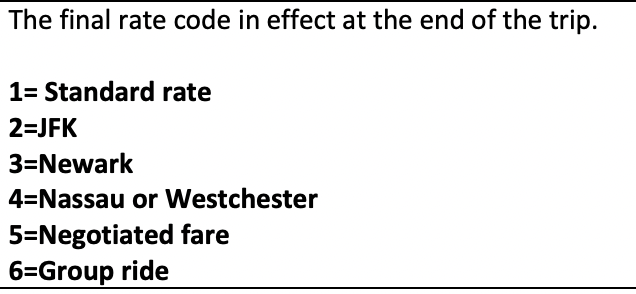

Let's now investigate the distribution.

In [ ]:
print("Percentages of trip having different rate codes:")
df["rate_code"].value_counts()/len(df)*1001

We see that most trips are paid using standard rate, and that some trips that involve JFK are paid using different rate system.

The trips to far-flung suburbs/neighboring towns only occupy a minority of our data.

Let's filter out trips that don't have rate code of either 1 or 2.

In [ ]:
df = df.loc[df["rate_code"].isin([1,2])]

#### Tips

First, let's see the overall distribution of tip for all trips.

In [ ]:
analyze_numeric_var(var = "tip", 
                    df = df, 
                    binwidth = 1,
                    var_unit = "dollar")

We see that the median tip is only USD 1, which is suspiciously low. Could it be that some of the drivers do not report the tips they received to avoid paying taxes? Such omission is possible only when the fare is paid in cash. 


Let's take a closer look at the tips for the trips paid in cash:

In [ ]:
len(df.loc[(df["payment_type"] == "CSH") & (df["tip"] == 0)])/len(df.loc[df["payment_type"] == "CSH"])

Our suspicion is confirmed - nearly **all** of these trips record a tip value of zero! 

Let's now see the tip distribution for all trips paid by credit card:

In [ ]:
analyze_numeric_var(var = "tip", 
                    df = df.loc[df["payment_type"] == "CRD"], 
                    binwidth = 1,
                    var_unit = "dollar")

Now we see that the median tip is a more respectable USD 2, around 15% of the median fare of USD 11.

With this observation in mind, going forward, whenever performing any analysis or predicition involving tips, I will only use trips paid using credit cards.

Let's see how the distribution of tips differ for trips involving the airports:

In [ ]:
analyze_numeric_var(var = "tip", 
                    df = df.loc[(df["payment_type"] == "CRD") & (df["include_JFK"] == True)], 
                    binwidth = 1,
                    var_unit = "dollar")

In [ ]:
analyze_numeric_var(var = "tip", 
                    df = df.loc[(df["payment_type"] == "CRD") & (df["include_laguardia"] == True)], 
                    binwidth = 1,
                    var_unit = "dollar")

We see that passangers are way more generous for the trips to/from JFK and La Guardia. 

## E. Conclusion and test set treatment

After performing all of the above feature engineering steps, we end up with a train dataframe that has the following columns:

**ID-related**
- `vehicle_id`
- `driver_id`


**Location-related**
- `start_long`
- `start_lat`
- `end_long`
- `end_lat`
- `start_gh`
- `end_gh`
- `trip_group_id`
- `trip_group_id_str`
-  `distance`
- `haversine_distance`
- `manhattan_distance`
- `include_JFK`
- `include_laguardia`


**Time-related**
- `start_time`
- `end_time`
- `duration`
- `start_hour`
- `day`
- `day_start_hour`


**Fare-related**
- `rate_code`
- `fare`
- `tip`
- `payment_type`

In [ ]:
# rearranging columns
df = df[['vehicle_id', 'driver_id',
         
         'start_long', 'start_lat', 'end_long', 'end_lat', 'start_gh', 'end_gh', 'trip_group_id',
         'trip_group_id_str', 'distance', 'haversine_distance', 'manhattan_distance','include_JFK',
         'include_laguardia',
         
         'start_time', 'end_time', 'duration', 'start_hour', 'day', 'day_start_hour',
        
         'rate_code', 'fare', 'tip', 'payment_type']]

df.head(1).T

We have applied some filtering logic to the training data to get rid of erroneous/irrelevant rows and engineered some new features. 


Let's apply the same steps to the test data:

### Feature engineering

In [ ]:
# location-related
test_df["haversine_distance"] = test_df.apply(lambda x: haversine((x.start_lat, x.start_long), (x.end_lat, x.end_long)), axis = 1)
test_df["manhattan_distance"] = test_df.apply(lambda x: manhattan((x.start_lat, x.start_long), (x.end_lat, x.end_long)), axis = 1)
test_df["start_gh"] = test_df.apply(lambda x: gh.encode(x.start_lat, x.start_long, precision = GH_PRECISION), axis = 1)
test_df["end_gh"] = test_df.apply(lambda x: gh.encode(x.end_lat, x.end_long, precision = GH_PRECISION), axis = 1)
test_df["trip_group_id"] = test_df.apply(lambda x: tuple({x.start_gh, x.end_gh}) if x.start_gh != x.end_gh else (x.start_gh, x.end_gh), axis = 1)
test_df["trip_group_id_str"] = test_df.apply(lambda x: str(x["trip_group_id"][1:-1]), axis = 1)
test_df["include_JFK"] = test_df.apply(lambda x: 
                             (haversine((x.start_lat, x.start_long), JFK_COORD) <= max_distance_mile) or 
                             (haversine(JFK_COORD, (x.end_lat, x.end_long)) <= max_distance_mile), axis = 1)

test_df["include_laguardia"] = test_df.apply(lambda x: 
                             (haversine((x.start_lat, x.start_long), LAGUARDIA_COORD) <= max_distance_mile_laguardia) or 
                             (haversine(LAGUARDIA_COORD, (x.end_lat, x.end_long)) <= max_distance_mile_laguardia), axis = 1)


# time-related
test_df["start_hour"] = test_df["start_time"].dt.hour
test_df["day"] = test_df["start_time"].dt.day_name()
test_df["day_start_hour"] = test_df["day"].str.cat(test_df["start_hour"].astype(str), sep = " - ")


### Filtering

In [ ]:
# location-related
test_df = test_df.loc[(test_df.start_lat >= NYC_LAT_LIMITS[0]) & (test_df.start_lat <= NYC_LAT_LIMITS[1])]
test_df = test_df.loc[(test_df.end_lat >= NYC_LAT_LIMITS[0]) & (test_df.end_lat <= NYC_LAT_LIMITS[1])]
test_df = test_df.loc[(test_df.start_long >= NYC_LONG_LIMITS[0]) & (test_df.start_long <= NYC_LONG_LIMITS[1])]
test_df = test_df.loc[(test_df.end_long >= NYC_LONG_LIMITS[0]) & (test_df.end_long <= NYC_LONG_LIMITS[1])]
test_df = filter_numeric_var("distance", test_df,  0)
test_df = filter_numeric_var("haversine_distance", test_df,  0)
test_df = filter_numeric_var("manhattan_distance", test_df,  0)

# time-related
test_df = filter_numeric_var("duration", test_df,  0)

# fare-related
test_df = test_df.loc[test_df["payment_type"].isin(["CSH","CRD"])]
test_df = test_df.loc[test_df["rate_code"].isin([1,2])]

In [ ]:
df.shape

In [ ]:
test_df.shape

# 2. Trip group analysis

## Section Summary

This section corresponds to the first question:


***In which <font color = "red"><b>trip groups</font> can you use the groups' <font color = "green"><b>mean values as measures of central tendency</font> to <font color = "blue"><b>estimate fare and duration</font>?***

    
Each colored part in the above sentence represents a problem that requires some analysis/definition. 
To answer this question, I will first tackle each part separately and draw a conclusion afterwards. The s
    
- <font color = "red"><b>Trip groups definition</font>
    
This part has been tackled before in section 1, where I defined a trip group as a collection of trips between the same two geohashes. When defining the trip groups, I do not differentiate between starting and ending points; that is, I consider trips from geohash A to geohash B to behave similarly in terms of duration and fare compared to trips going the opposite direction.
    
Further analysis of each trip group is given by part A. 
    

- <font color = "blue"><b>Estimation of fare and duration for each group</font>
    
    
We can think of each trip group as its own **population**; this population is associated with several **parameters** such as the population-level mean of `fare` and `duration` – $\mu_{duration}$ and $\mu_{fare}$. The few instances from each trip group that we have in our dataset serve as **samples** that represent these populations.
    
The question I will tackle in this subsection is therefore as follows: 
    
*For each trip group, do we have enough samples to confidently draw inferences about their corresponding populations?*
    
Part B will investigate this question depth.
     
- <font color = "green"><b>The use of means as measures of central tendency for each group</font>
    
In statistics, we know several measures of central tendency. For continous variables such as `fare` and `duration`, the most important measures of central tendency are mean and median. 
    
Median is considered as the more robust of the two as its value is not swayed by outliers. The mean value, on the other hand, can diverge from the medians in populations that are skewed.
    
As such, in part C, I will investigate the skewness of each trip group and decide whether or not the group has low enough skewness to warrant the use of mean value as measure of central tendency.


## A. Defining and visualizing trip groups

First, let's create another dataframe, `trip_group_df`, that classifies our trips into different trip groups using the `trip_group_id` we created in section 1.

Afterwards, let's append the representative coordinates for each trip group. 

In [ ]:
trip_group_df = df.groupby(["trip_group_id"]).size().reset_index().sort_values(by = 0, ascending = False)
trip_group_df.columns = ["trip_group_id", "n_trips"]
trip_group_df.reset_index(inplace = True, drop = True)

In [ ]:
# Geohashes to coordinates
trip_group_df["start_coord"] = trip_group_df.apply(lambda x: gh.decode(x.trip_group_id[0]), axis = 1)
trip_group_df["end_coord"] = trip_group_df.apply(lambda x: gh.decode(x.trip_group_id[1]), axis = 1)
trip_group_df.set_index("trip_group_id", inplace = True)

In [ ]:
trip_group_df["address"] = None

Let's now visualize the 5 most common trips in our dataset.

In [ ]:
fig=Figure(width=1000,height=600)

m = folium.Map(
    location=[(NYC_LAT_LIMITS[0] + NYC_LAT_LIMITS[1])/2, (NYC_LONG_LIMITS[0] + NYC_LONG_LIMITS[1])/2],
    zoom_start=12,
    zoom_control=True,
    scrollWheelZoom=False,
    dragging=True,
    tiles = "CartoDB positron",
)

#add lines
TOP_N = 5
no = 1

for idx, row in trip_group_df.head(TOP_N).iterrows():
    start_addr = coord_to_addr(row["start_coord"])
    end_addr = coord_to_addr(row["end_coord"])
    addr = start_addr + " -- " + end_addr
    points = [row["start_coord"], row["end_coord"]]
    folium.PolyLine(points, 
                    weight=5, 
                    opacity=1, 
                    tooltip = str(no) + ") " + addr).add_to(m)
    trip_group_df.at[idx, "address"] = addr
    
    no = no + 1


print("Most common trip groups in NYC:")
fig.add_child(m)

In [ ]:
trip_group_df.head(TOP_N)[["n_trips", "address"]].reset_index()

We see that the most common trips in our dataset take place in central Manhattan near Broadway.

It does make sense that theatre-goers, most of whom are relatively wealthy and want to arrive to their shows on time by taking cabs (hence avoiding NYC's infamous public transport system).


Note that each of these trip groups is associated with its own `fare` and `duration` distribution. For example, here is the distrubution for the `("dr5rud", "dr5ru6")` trip group:

In [ ]:
VAR = "fare"
sns.set_theme()
sns.histplot(df.loc[df["trip_group_id"] == ("dr5ru6", "dr5rud"), VAR], bins = 20).set_title(f'Distribution of {VAR} (USD)')

In [ ]:
VAR = "duration"
sns.set_theme()
sns.histplot(df.loc[df["trip_group_id"]  == ("dr5ru6", "dr5rud"), VAR], bins = 20).set_title(f'Distribution of {VAR} (sec)')

## B. Calculating minimum sample size for population mean estimation

### Background theory

Having defined the trip group, now I'm interested to see if I can use the samples within the group to perform some inferences.

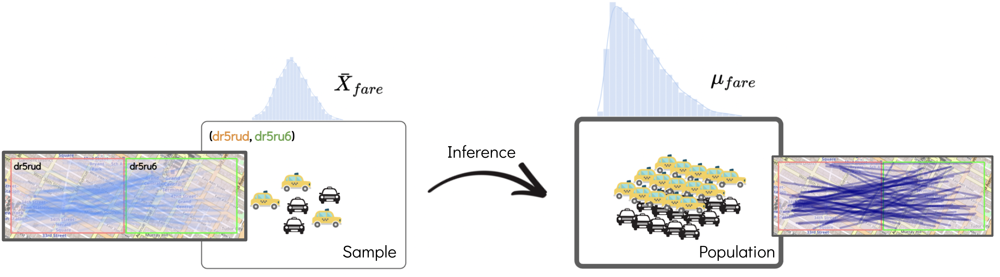

As mentioned before, we can think of each trip group as its own **population**; this population is associated with several **parameters** such as the population-level mean of `fare` and `duration` – $\mu_{duration}$ and $\mu_{fare}$. If, hypothetically, we had access to every single trip within each trip group, we would be able to calculate these parameters. 

Unfortunately, we don't have such an exhaustive dataset. What we do have is **limited number** of trips for each trip group in the dataset, which we can regard as **samples**. From this, we can easily calculate some **statistics**, such as sample-level averages of `duration` and `fare` – $\bar{X}_{duration}$ and $\bar{X}_{fare}$.

The question now is:

***For each trip group - do we have sufficient sample size to confidently extrapolate the population-level means $\mu_{duration}$ and $\mu_{fare}$  from the sample-level means $\bar{X}_{duration}$ and $\bar{X}_{fare}$?***

To answer this, we need to review some statistical concepts surrounding parameter estimation.

We know that estimates are never perfect. When we use a sample statistic (e.g. the sample mean) to estimate a parameter (e.g. the population mean), our estimate will be associated with a certain *confidence interval (CI)*.
CI is a range of estimates, defined by a lower bound and upper bound, for an unknown parameter. This interval is computed at a designated confidence level. 

The width of this interval depends on three things:
- the sample size
- the confidence level
- and the amount of variance within the data (as represented by the standard deviation).

To be more precise, the confidence interval for population mean is governed by the following equation:


$$
CI = \bar{x} \pm z \frac{\sigma}{\sqrt{n}}
$$



where:
- $\bar{x}$ is the sample mean
- z is a standard Z-score for the desired level of confidence (1.96 for a 95% confidence interval)
- $\sigma$ is the sample standard deviation. If $\sigma$ is unknown, like in our case, we can substitute it with the worst-case scenario.
- $n$ is the number of samples we have.

If we define the margin of error, MoE, to be half of the width of this interval, we can rearrange the equation to obtain the formula for $n$, the minimum number of samples to obtain a desired level of confidence given a certain population standard deviation and a certain margin of error:




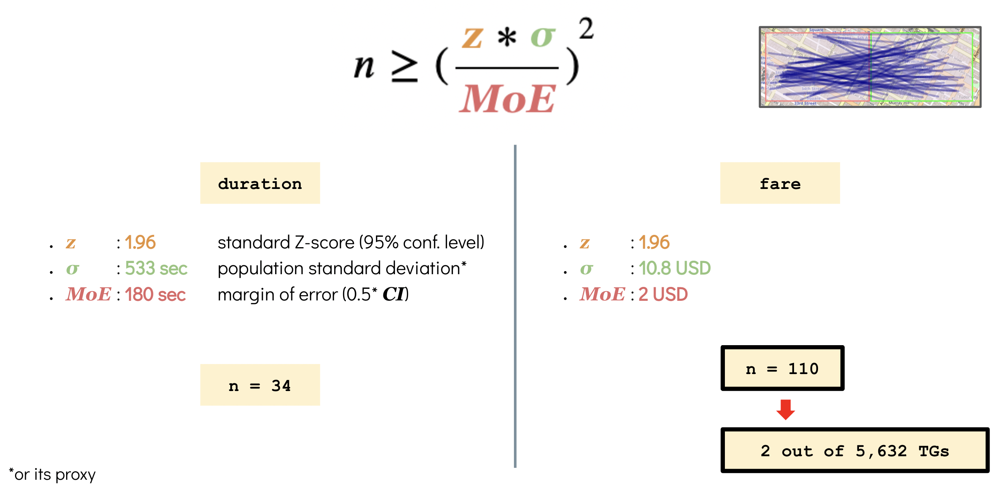

We can then insert the appropriate values of $z$, $\sigma$ and $MoE$ to obtain the minimum number of samples $n$.

In [ ]:
# for duration:

z_duration = 1.96
sigma_duration = np.std(df["duration"])
MoE_duration = 180
# MoE has the same unit as the variable being analyzed. 
# for `duration`, the MoE has a unit of seconds
# A margin of error of 180 seconds (3 minutes) when estimating duration of a trip seem reasonable.

# this is to "round up" the float
n_duration = int((z_duration*sigma_duration/MoE_duration)**2 + 1)
n_duration

Note that the value for the $\sigma$ I used above comes from the standard deviation of the `duration` variable in the dataset. The standard deviation is technically not the same as the population standard deviation of the `duration` variable for each trip group, but we will use this number as a proxy.

In [ ]:
# for fare:

z_fare = 1.96
sigma_fare = np.std(df["fare"])
MoE_fare = 2
# Again, MoE has the same unit as the variable being analyzed. 
# for `fare`, the MoE has a unit of dollars
# A margin of error of USD 2 when estimating fare seem reasonable

n_fare = int((z_fare*sigma_fare/MoE_fare)**2+ 1)
n_fare

We will use the larger one between the above two to determine whether a trip group is large enough for both `fare` and `duration` inferences to be made from it.

In [ ]:
trip_group_df["enough_sample_size"] = False
N_TRIPS_THRESHOLD = max(n_fare, n_duration)
trip_group_df["enough_sample_size"] = trip_group_df["n_trips"] >= N_TRIPS_THRESHOLD
percentage = trip_group_df["enough_sample_size"].sum()/len(trip_group_df)*100
print(f"{percentage:.2f}% of the trip groups ({trip_group_df['enough_sample_size'].sum()} trips) have enough sample size (n_trips > {N_TRIPS_THRESHOLD})" )
print("These trip groups's sample means can be used to approximate the population means." )


## C. Using sample means to estimate the value of a random variable

### Background theory



The mean is usually the best measure of central tendency to use when our data distribution is continuous and symmetrical, for example, when the data is normally distributed. If the data is skewed, then the median is usually preferred.

As such, we are going to measure the skewness of the in-group distribution of `fare`. and `duration` for each trip group.

This will be done using the [`skewtest`](https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.skewtest.html) function from scipy, which tests whether the skew is different from the normal distribution. This function tests the null hypothesis that the skewness of the population that the sample was drawn from is the same as that of a corresponding normal distribution.

A p value below the treshold of 0.05 indicates absence of skewness.

### Measuring the skewness of `fare` and `duration`  within each trip group

In [ ]:
trip_group_df["fare_skewness_pval"] = None
trip_group_df["duration_skewness_pval"] = None
trip_group_df["fare_is_not_skewed"] = None
trip_group_df["duration_is_not_skewed"] = None

In [ ]:
PVAL_THRESH = 0.05
for trip_group_id, row in trip_group_df.iterrows():
    _df = df.loc[df["trip_group_id"] == trip_group_id]
    try:
        fare_skewness_pval = skewtest(_df["fare"])[1]
        duration_skewness_pval = skewtest(_df["duration"])[1]
        trip_group_df.at[trip_group_id, "fare_skewness_pval"] = fare_skewness_pval
        trip_group_df.at[trip_group_id, "duration_skewness_pval"] = duration_skewness_pval
        trip_group_df.at[trip_group_id, "fare_is_not_skewed"] = fare_skewness_pval <= PVAL_THRESH
        trip_group_df.at[trip_group_id, "duration_is_not_skewed"] = duration_skewness_pval <= PVAL_THRESH
    except:
        # exception happens when too few samples (< 8) are provided
        trip_group_df.at[trip_group_id, "fare_skewness_pval"] = None
        trip_group_df.at[trip_group_id, "duration_skewness_pval"] = None
        trip_group_df.at[trip_group_id, "fare_is_not_skewed"] = None
        trip_group_df.at[trip_group_id, "duration_is_not_skewed"] = None

In [ ]:
percentage_fare = (trip_group_df["fare_is_not_skewed"] == True).sum()/len(trip_group_df)*100
print(f"{percentage_fare:.2f}% of the trip groups have a fare distribution that is not skewed, for which mean can be used as a measure of central tendency")


percentage_duration = (trip_group_df["duration_is_not_skewed"] == True).sum()/len(trip_group_df)*100
print(f"{percentage_duration:.2f}% of the trip groups have a duration distribution that is not skewed, for which mean can be used as a measure of central tendency")


## D. Conclusion

Going back to the original question:

*In which <font color = "red"><b>trip groups</font> can you use the groups' <font color = "green"><b>mean values as measures of central tendency</font> to <font color = "blue"><b>estimate fare and duration</font>?*

Here are the trip groups that meet the requiremeents: 

In [ ]:
trip_group_df.loc[(trip_group_df["enough_sample_size"] == True) &
                  (trip_group_df["fare_is_not_skewed"] == True) & 
                  (trip_group_df["duration_is_not_skewed"] == True)]

Out of the 5,632 trip groups, we only have two few trip groups for which:
- we have enough samples to make inferences about `duration` and `fare` population means
- the distribution of  `duration` and `fare` in these groups are not skewed, hence their mean values can be used as a measure of central tendency

In [ ]:
selected_trip_groups = trip_group_df.loc[(trip_group_df["enough_sample_size"] == True) &
                      (trip_group_df["fare_is_not_skewed"] == True) & 
                      (trip_group_df["duration_is_not_skewed"] == True)].index.to_list()
selected_trip_groups

Let's now visualize them:

In [ ]:
GEOHASH_START = "dr5rud" # an example start geohash 
GEOHASH_END = "dr5ru6" # an example end geohash
fig = visualize_trips(GEOHASH_END, GEOHASH_START, df)
fig

We can see that the above trip group connects the area surrounding the Grand Central and the area just west to it around Penn Station.


Let's now visualize the other one:

In [ ]:
GEOHASH_START = "dr5rud" 
GEOHASH_END = "dr5rus" 
fig = visualize_trips(GEOHASH_START, GEOHASH_END, df)
fig

We can see that the above trip group connects the area surrounding the Grand Central and the 54th Street/6th Avenue intersection, where the Museum of Modern Art is located.

# 3. Modeling

## Section summary

This section focuses on the training and evaluation of two machine learning models: fare prediction model and tip prediction model.

The steps to building the fare and tip prediction model is as follows:

**1. Train test split**

This was the first thing we did in section 1, where I split our dataset into train and test sets with a ratio of 9:1.

**2. EDA and feature engineering**

These steps were done in section 1, where I explored the train set and engineer features I expected to have some predictive powers in the modeling steps.

**3. Modeling**

For both tip and fare prediction, three regression models are created using the train set. The models are evaluated using RMSE against the test set; both in its entirety as well as portion-wise to detect bias. 

- **1. Hardcoded-model**


- **2. All-features model**


- **3. Selected-features model**





## A. Modeling: `fare`

### model 1: hardcoded rule

There exists an “official” way of calculating the total fare, which uses a formula that takes into account, among other, the distance travelled, the time of travel, and the locations.

I am going to simply this official formula and use this fare-calculation formula as my first “model”. This model will serve as my baseline.

Below is the rule, taken from NYC taxi [website](https://www1.nyc.gov/site/tlc/passengers/taxi-fare.page)

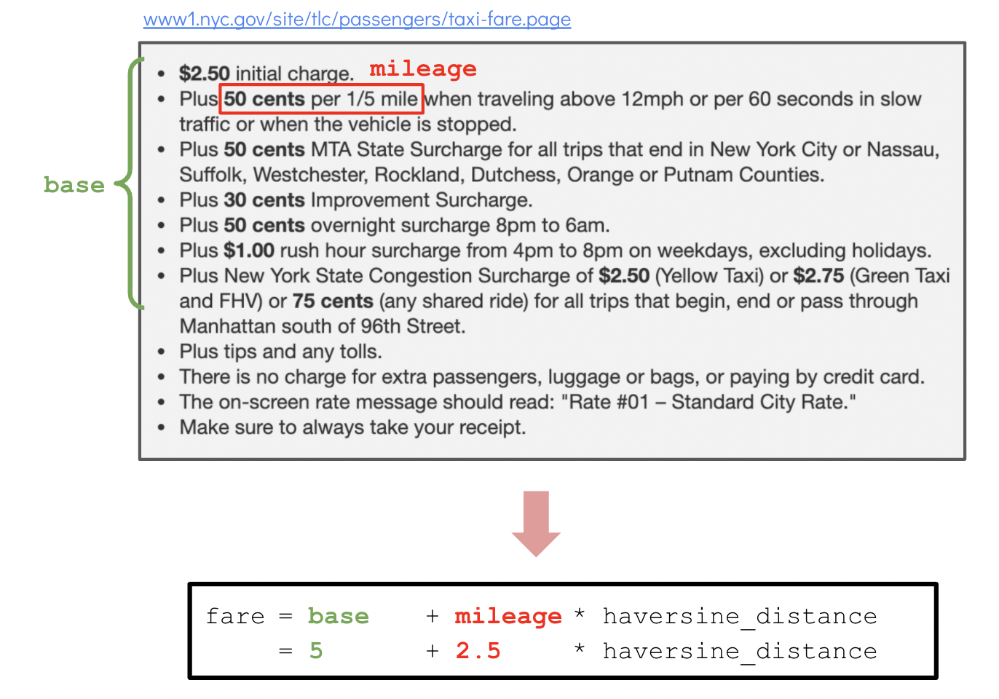

We will simplify this as follows:


fare = 5 + `haversine_distance`*2.5  

Where 5 refers to a simplified lumpsump that includes initial charge and surcharges and 2.5 refers to the fare of 50 cents per 1/5 mile.

In [ ]:
TARGET = "fare"
y_test = test_df[TARGET]
y_test_pred = 5 + test_df["haversine_distance"]*2.5

The error for this model for the entire test set is as follows:

In [ ]:
print(f'RMSE: USD {mean_squared_error(y_test_pred,y_test, squared = False):.2f}')
print(f'Mean error (prediction - true value): USD {mean_error(y_test_pred, y_test):.2f}')

Now let's take a look at the RMSE for (test set) trips to or from the airport:

In [ ]:
_df = test_df.loc[test_df["include_JFK"] == True]
y_test = _df[TARGET]
y_test_pred = 5 + _df["haversine_distance"]*2.5

print(f'RMSE: USD {mean_squared_error(y_test_pred,y_test, squared = False):.2f}')
print(f'Mean error (prediction - true value): USD {mean_error(y_test_pred, y_test):.2f}')

In [ ]:
_df = test_df.loc[test_df["include_laguardia"] == True]
y_test = _df[TARGET]
y_test_pred = 5 + _df["haversine_distance"]*2.5

print(f'RMSE: USD {mean_squared_error(y_test_pred,y_test, squared = False):.2f}')
print(f'Mean error (prediction - true value): USD {mean_error(y_test_pred, y_test):.2f}')

We see that our simple hard coded model constantly underestimates total fare.

This is even more severe in airport trips, which (1) as we have seen, usually are associated with higher tips and (2) might involve more tolls and surcharges.

### Model 2: All features

Here, we will use PyCaret to train 5 models using all the features we engineered from the drop-off/pick-up points and the time of travel.

In [ ]:
ALL_FEATURES = ["start_long",
                "start_lat",
                "end_long", 
                "end_lat",  
                "start_gh", 
                "end_gh", 
                "trip_group_id_str", 
                "include_JFK",
                "include_laguardia",
                "haversine_distance",
                "manhattan_distance", 
                "start_hour",
                "day",
                "day_start_hour",
               ]

TARGET = "fare"

In [ ]:
setup1 = setup(df[ALL_FEATURES + [TARGET]] , target = TARGET, session_id=123, log_experiment=True, experiment_name=TARGET, test_data=test_df)

In [ ]:
best_model = compare_models(fold=5, include = ["catboost",  "lr", "rf", "lasso", "ridge"])

In [ ]:
# a catboost model trained on all supplied features
cb_all = create_model('catboost', fold = 5)

In [ ]:
# hypertuned version of `cb_all`
tuned_cb_all = tune_model(cb_all, n_iter=50, optimize = 'RMSE', fold = 5)

In [ ]:
plot_model(tuned_cb_all, plot = 'error')

In [ ]:
plot_model(tuned_cb_all, plot = 'feature')

In [ ]:
interpret_model(tuned_cb_all)

#### Test prediction

In [ ]:
# predict on hold-out
y_test = predict_model(tuned_cb_all)

### Model 3: Feature Selection

Here, we will use PyCaret to train 5 models using a selection of the features we engineered from the drop-off/pick-up points and the time of travel.

In [ ]:
ALL_FEATURES = ["start_long",
                "start_lat",
                "end_long", 
                "end_lat",  
                "start_gh", 
                "end_gh", 
                "trip_group_id_str", 
                "include_JFK",
                "include_laguardia",
                "haversine_distance",
                "manhattan_distance", 
                "start_hour",
                "day",
                "day_start_hour",
               ]

TARGET = "fare"

In [ ]:
setup2 = setup(df[ALL_FEATURES + [TARGET]] , target = TARGET, session_id=123, log_experiment=True, feature_selection = True, experiment_name=TARGET, test_data=test_df)

In [ ]:
best_model = compare_models(fold=5, include = ["catboost",  "lr", "rf", "lasso", "ridge"])

In [ ]:
cb_partial = create_model('catboost', fold = 5)

In [ ]:
tuned_cb_partial = tune_model(cb_all, n_iter=50, optimize = 'RMSE', fold = 5)

In [ ]:
plot_model(tuned_cb_partial, plot = 'error')

In [ ]:
plot_model(tuned_cb_partial, plot = 'feature')

In [ ]:
interpret_model(tuned_cb_partial)

#### Test prediction

In [ ]:
# predict on hold-out
y_test = predict_model(tuned_cb_all)

## Tip prediction

In [ ]:
# We'll only use trips paid using credit card
df2 = df[df["payment_type"] == "CRD"]
test_df2 = test_df[test_df["payment_type"] == "CRD"]

### model 1: hardcoded rule

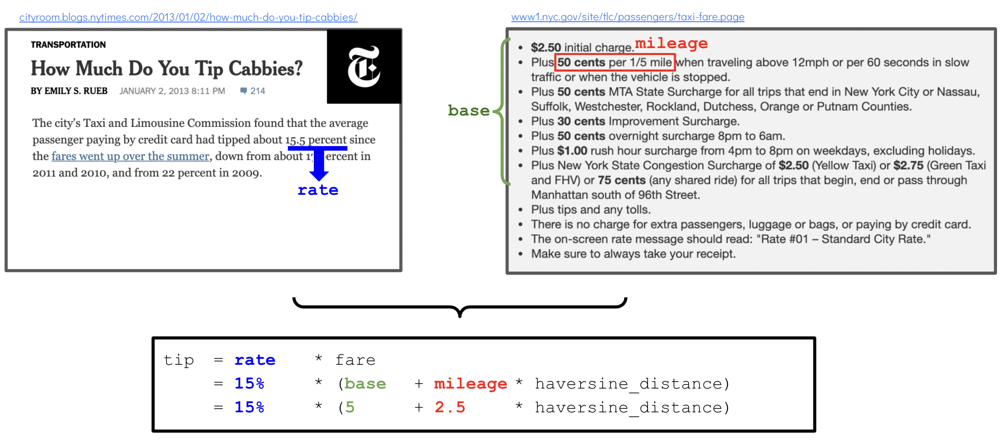

In [ ]:
TARGET = "tip"
y_test = test_df2[TARGET]
y_test_pred = (5 + test_df2["haversine_distance"]*2.5)*0.15

The error for this model for the entire test set is as follows:

In [ ]:
print(f'RMSE: USD {mean_squared_error(y_test_pred,y_test, squared = False):.2f}')
print(f'Mean error (prediction - true value): USD {mean_error(y_test_pred, y_test):.2f}')

Now let's take a look at the RMSE for (test set) trips to or from the airport:

In [ ]:
_df2 = test_df2.loc[test_df2["include_JFK"] == True]
y_test = _df2[TARGET]
y_test_pred = (5 + _df2["haversine_distance"]*2.5)*0.15

print(f'RMSE: USD {mean_squared_error(y_test_pred,y_test, squared = False):.2f}')
print(f'Mean error (prediction - true value): USD {mean_error(y_test_pred, y_test):.2f}')

In [ ]:
_df2 = test_df2.loc[test_df2["include_laguardia"] == True]
y_test = _df2[TARGET]
y_test_pred = (5 + _df2["haversine_distance"]*2.5)*0.15

print(f'RMSE: USD {mean_squared_error(y_test_pred,y_test, squared = False):.2f}')
print(f'Mean error (prediction - true value): USD {mean_error(y_test_pred, y_test):.2f}')

We see that our simple hard coded model constantly underestimates tip. 

### Model 2: All features

Here, we will use PyCaret to train 5 models using all the features we engineered from the drop-off/pick-up points and the time of travel.

In [ ]:
ALL_FEATURES = ["start_long",
                "start_lat",
                "end_long", 
                "end_lat",  
                "start_gh", 
                "end_gh", 
                "trip_group_id_str", 
                "include_JFK",
                "include_laguardia",
                "haversine_distance",
                "manhattan_distance", 
                "start_hour",
                "day",
                "day_start_hour",
               ]

TARGET = "tip"

In [ ]:
setup1 = setup(df[ALL_FEATURES + [TARGET]] , target = TARGET, session_id=123, log_experiment=True, experiment_name=TARGET, test_data=test_df)

In [ ]:
best_model = compare_models(fold=5, include = ["catboost",  "lr", "rf", "lasso", "ridge"])

In [ ]:
# a catboost model trained on all supplied features
cb_all = create_model('catboost', fold = 5)

In [ ]:
# hypertuned version of `cb_all`
tuned_cb_all = tune_model(cb_all, n_iter=50, optimize = 'RMSE', fold = 5)

In [ ]:
plot_model(tuned_cb_all, plot = 'error')

In [ ]:
plot_model(tuned_cb_all, plot = 'feature')

In [ ]:
interpret_model(tuned_cb_all)

#### Test prediction

In [ ]:
# predict on hold-out
y_test = predict_model(tuned_cb_all)

### Model 3: Feature Selection

Here, we will use PyCaret to train 5 models using a selection of the features we engineered from the drop-off/pick-up points and the time of travel.

In [ ]:
ALL_FEATURES = ["start_long",
                "start_lat",
                "end_long", 
                "end_lat",  
                "start_gh", 
                "end_gh", 
                "trip_group_id_str", 
                "include_JFK",
                "include_laguardia",
                "haversine_distance",
                "manhattan_distance", 
                "start_hour",
                "day",
                "day_start_hour",
               ]

TARGET = "fare"

In [ ]:
setup2 = setup(df[ALL_FEATURES + [TARGET]] , target = TARGET, session_id=123, log_experiment=True, feature_selection = True, experiment_name=TARGET, test_data=test_df)

In [ ]:
best_model = compare_models(fold=5, include = ["catboost",  "lr", "rf", "lasso", "ridge"])

In [ ]:
cb_partial = create_model('catboost', fold = 5)

In [ ]:
tuned_cb_partial = tune_model(cb_all, n_iter=50, optimize = 'RMSE', fold = 5)

In [ ]:
plot_model(tuned_cb_partial, plot = 'error')

In [ ]:
plot_model(tuned_cb_partial, plot = 'feature')

In [ ]:
interpret_model(tuned_cb_partial)

#### Test prediction

In [ ]:
# predict on hold-out
y_test = predict_model(tuned_cb_all)

# 4. Optimization

In this section, I will use the insights generated before to suggests ways for taxi owners and taxi drivers to maximize their earnings. Specifically, I will answer the following three questions:

<font color = "green">
    
1. If you were a taxi owner, how would you maximize your earnings in a day?
2. If you were a taxi owner, how would you minimize your work time while retaining the average wages earned by a typical taxi in the dataset?
3. If you run a taxi company with 10 taxis, how would you maximize your earnings?
    
</font>

There are some overlap to these questions as all of them aim to optimize earnings to a certain extent. Hence, I will perform the analysis together.

To answer these questions, I will make the following assumptions:
- The taxi owner's earnings come solely from driving the taxi (that is, despite being the owner of the taxi, the person can't obtain earnings by renting out his taxi)
- His working hours are not fixed
- He can't refuse a potential customer based on their destination 
- He is not part of transport-sharing company like Uber


My strategy is as follows:
- I will revisit the activity heatmap I created earlier to take another look the days/times where there are a lot of pick up activities going on
- For these time, I investigate where exactly in NYC these pick up activities happen

As a taxy owner, I will then set my working time to be within these "profitable" windows and I will be cruising in areas that have a lot of potential passangers. 

In [ ]:
heatmap_activity

Now let's take a look at areas within NYC where there are a lot of potential passengers:

In [ ]:
fig=Figure(width=800,height=500)
m = folium.Map(
    location=[(NYC_LAT_LIMITS[0] + NYC_LAT_LIMITS[1])/2, (NYC_LONG_LIMITS[0] + NYC_LONG_LIMITS[1])/2],
    zoom_start=12,
    zoom_control=True,
    scrollWheelZoom=False,
    dragging=False

)
# weekday morning
START_HOUR = 8
END_HOUR = 10
_df = df.loc[(df["start_hour"].isin(range(START_HOUR,END_HOUR+1))) & (df["day"].isin(set(DAYS) - {"Saturday", "Sunday"}))]


# add 10 rectangles that indicate the most active geohashes in the specified time periods:
gh_df = _df.groupby("start_gh").size()
gh_df.sort_values(ascending = False, inplace = True)
gh_df = gh_df.head(10)
for ghash, n_trips in zip (gh_df.index, gh_df):
    gh_limits = gh.bbox(ghash) 
    bounds = [(gh_limits["n"], gh_limits["w"]),
              (gh_limits["s"], gh_limits["w"]),
              (gh_limits["n"], gh_limits["e"]),
              (gh_limits["s"], gh_limits["e"])]
        # main map
    folium.Rectangle(bounds=bounds, color="#572a27", fill=True, fill_color="#f2e1f1", fill_opacity=n_trips/gh_df.max()).add_to(m)
    fig.add_child(m)
        
# add cluster points
coordinate_list = _df[["start_lat", "start_long"]].values.tolist() + _df[["end_lat", "end_long"]].values.tolist() 
m.add_child(FastMarkerCluster(coordinate_list))

fig


In [ ]:
fig=Figure(width=800,height=500)
m = folium.Map(
    location=[(NYC_LAT_LIMITS[0] + NYC_LAT_LIMITS[1])/2, (NYC_LONG_LIMITS[0] + NYC_LONG_LIMITS[1])/2],
    zoom_start=12,
    zoom_control=True,
    scrollWheelZoom=False,
    dragging=True

)
# weekday evening
START_HOUR = 19
END_HOUR = 23
_df = df.loc[(df["start_hour"].isin(range(START_HOUR,END_HOUR+1))) & (df["day"].isin(set(DAYS) - {"Saturday", "Sunday"}))]


# add 10 rectangles that indicate the most active geohashes in the specified time periods:
gh_df = _df.groupby("start_gh").size()
gh_df.sort_values(ascending = False, inplace = True)
gh_df = gh_df.head(10)
for ghash, n_trips in zip (gh_df.index, gh_df):
    gh_limits = gh.bbox(ghash) 
    bounds = [(gh_limits["n"], gh_limits["w"]),
              (gh_limits["s"], gh_limits["w"]),
              (gh_limits["n"], gh_limits["e"]),
              (gh_limits["s"], gh_limits["e"])]
        # main map
    folium.Rectangle(bounds=bounds, color="#572a27", fill=True, fill_color="#f2e1f1", fill_opacity=0.1).add_to(m)
    fig.add_child(m)
        
# add cluster points
coordinate_list = _df[["start_lat", "start_long"]].values.tolist() + _df[["end_lat", "end_long"]].values.tolist() 
m.add_child(FastMarkerCluster(coordinate_list))

fig

The answer to the questions:

<font color = "green">
    
1. If you were a taxi owner, how would you maximize your earnings in a day?

</font>


- I will ensure that my working hours are sometime between 6 h - 23 h on weekdays, preferably including the evening. This is when most pick-ups take place.
- In all time windows, the area directly to the South of the Central Park is always a hotspot for pick-ups. If I don't have a passenger, I will spend my time circling in this area or waiting in the taxi stand.


<font color = "green">
    
2. If you were a taxi owner, how would you minimize your work time?
    
</font>

My answer to this question is similar to my answer in the first question.

I would minimize my work time by setting my working periods in the evening, starting from the end-of-day rush hour (17 h) until late evening (23 h). I will circle around Central Manhattan as mentioned before.

I would especially avoid the early morning hours (i.e. 2 am - 5 am) on weekdays because the demand for taxis is very low at these times. 


<font color = "green">
    
3. If you run a taxi company with 10 taxis, how would you maximize your earnings?
</font>

Again, my answer will be similar to the above answers. 

Assuming that (1) my taxis can be driven all day long and that (2) the average per-hour salary I have to pay my drivers is lower than the expected earning within that time window, I will have the taxis driven 24/7 and will isntruct the drivers to circle around the most popular pickup and dropoff locations in Central Manhattan.

The size of the fleet is small enough that the intra-company competition will be negligible. 

If the taxis need to be serviced, I will ensure that the taxis are serviced in the least profitable hours, such as early weekday mornings (i.e. 2 am - 5 am), or, if this is not possible, before 9 am on Sunday. 



# Graveyard

The sections below are old codes

In [ ]:
ALL_FEATURES = ["start_long",
                "start_lat",
                "end_long", 
                "end_lat",  
                "start_gh", 
                "end_gh", 
                "trip_group_id_str", 
                "include_JFK",
                "include_laguardia",
                "haversine_distance",
                "manhattan_distance", 
                "start_hour",
                "day",
                "day_start_hour",
               ]

TARGET = "fare"

In [ ]:
X_train = df[ALL_FEATURES]
y_train = df[TARGET]

In [ ]:
cat_features_indices = np.where(X_train.dtypes != np.float)[0]
reg =  CatBoostRegressor()
reg.fit(X_train,y_train, cat_features=cat_features_indices)

In [ ]:
y_test = test_df[TARGET]
X_test = test_df[ALL_FEATURES]
y_test_pred = reg.predict(X_test)
print(f'RMSE: USD {mean_squared_error(y_test_pred,y_test, squared = False):.2f}')
print(f'Mean error (prediction - true value): USD {mean_error(y_test_pred, y_test):.2f}')

In [ ]:
_df = test_df.loc[test_df["include_JFK"] == True]
y_test = _df[TARGET]
X_test = _df[ALL_FEATURES]
y_test_pred = reg.predict(X_test)

print(f'RMSE: USD {mean_squared_error(y_test_pred,y_test, squared = False):.2f}')
print(f'Mean error (prediction - true value): USD {mean_error(y_test_pred, y_test):.2f}')

In [ ]:
_df = test_df.loc[test_df["include_laguardia"] == True]
y_test = _df[TARGET]
X_test = _df[ALL_FEATURES]
y_test_pred = reg.predict(X_test)

print(f'RMSE: USD {mean_squared_error(y_test_pred,y_test, squared = False):.2f}')
print(f'Mean error (prediction - true value): USD {mean_error(y_test_pred, y_test):.2f}')

Now let's investigate the feature importance:

In [ ]:
feature_importance_df = pd.concat([pd.Series(reg.feature_names_),pd.Series(reg.feature_importances_)], axis = 1)
feature_importance_df.columns = ["feature", "importance"]
feature_importance_df.sort_values(by = "importance", inplace = True, ascending = False)
feature_importance_df

As expected, the distance metrics exhibit higher feature importance.

### model 3: selected features

In [ ]:
top_features = feature_importance_df.head(5)["feature"].values

In [ ]:
X_train = df[top_features]
y_train = df[TARGET]

In [ ]:
cat_features_indices = np.where(X_train.dtypes != np.float)[0]
reg =  CatBoostRegressor()
reg.fit(X_train,y_train, cat_features=cat_features_indices)

In [ ]:
y_test = test_df[TARGET]
X_test = test_df[top_features]
y_test_pred = reg.predict(X_test)
print(f'RMSE: USD {mean_squared_error(y_test_pred,y_test, squared = False):.2f}')
print(f'Mean error (prediction - true value): USD {mean_error(y_test_pred, y_test):.2f}')

In [ ]:
_df = test_df.loc[test_df["include_JFK"] == True]
y_test = _df[TARGET]
X_test = _df[top_features]
y_test_pred = reg.predict(X_test)

print(f'RMSE: USD {mean_squared_error(y_test_pred,y_test, squared = False):.2f}')
print(f'Mean error (prediction - true value): USD {mean_error(y_test_pred, y_test):.2f}')

In [ ]:
_df = test_df.loc[test_df["include_laguardia"] == True]
y_test = _df[TARGET]
X_test = _df[top_features]
y_test_pred = reg.predict(X_test)

print(f'RMSE: USD {mean_squared_error(y_test_pred,y_test, squared = False):.2f}')
print(f'Mean error (prediction - true value): USD {mean_error(y_test_pred, y_test):.2f}')

## B. Modeling: `tip`

In [ ]:
cat_features_indices = np.where(X_train.dtypes != np.float)[0]
reg =  CatBoostRegressor()
reg.fit(X_train,y_train, cat_features=cat_features_indices)

In [ ]:
y_test = test_df2[TARGET]
X_test = test_df2[ALL_FEATURES]
y_test_pred = reg.predict(X_test)
print(f'RMSE: USD {mean_squared_error(y_test_pred,y_test, squared = False):.2f}')
print(f'Mean error (prediction - true value): USD {mean_error(y_test_pred, y_test):.2f}')

In [ ]:
_df2 = test_df2.loc[test_df["include_JFK"] == True]
y_test = _df2[TARGET]
X_test = _df2[ALL_FEATURES]
y_test_pred = reg.predict(X_test)

print(f'RMSE: USD {mean_squared_error(y_test_pred,y_test, squared = False):.2f}')
print(f'Mean error (prediction - true value): USD {mean_error(y_test_pred, y_test):.2f}')

In [ ]:
_df2 = test_df2.loc[test_df2["include_laguardia"] == True]
y_test = _df2[TARGET]
X_test = _df2[ALL_FEATURES]
y_test_pred = reg.predict(X_test)

print(f'RMSE: USD {mean_squared_error(y_test_pred,y_test, squared = False):.2f}')
print(f'Mean error (prediction - true value): USD {mean_error(y_test_pred, y_test):.2f}')

Now let's investigate the feature importance:

In [ ]:
feature_importance_df = pd.concat([pd.Series(reg.feature_names_),pd.Series(reg.feature_importances_)], axis = 1)
feature_importance_df.columns = ["feature", "importance"]
feature_importance_df.sort_values(by = "importance", inplace = True, ascending = False)
feature_importance_df

As expected, the distance metrics exhibit higher feature importance.

### model 3: selected features

In [ ]:
top_features = feature_importance_df.head(5)["feature"].values

In [ ]:
X_train = df2[top_features]
y_train = df2[TARGET]

In [ ]:
cat_features_indices = np.where(X_train.dtypes != np.float)[0]
reg =  CatBoostRegressor()
reg.fit(X_train,y_train, cat_features=cat_features_indices)

In [ ]:
y_test = test_df2[TARGET]
X_test = test_df2[top_features]
y_test_pred = reg.predict(X_test)
print(f'RMSE: USD {mean_squared_error(y_test_pred,y_test, squared = False):.2f}')
print(f'Mean error (prediction - true value): USD {mean_error(y_test_pred, y_test):.2f}')

In [ ]:
_df2 = test_df2.loc[test_df["include_JFK"] == True]
y_test = _df2[TARGET]
X_test = _df2[top_features]
y_test_pred = reg.predict(X_test)

print(f'RMSE: USD {mean_squared_error(y_test_pred,y_test, squared = False):.2f}')
print(f'Mean error (prediction - true value): USD {mean_error(y_test_pred, y_test):.2f}')

In [ ]:
_df2 = test_df2.loc[test_df["include_laguardia"] == True]
y_test = _df2[TARGET]
X_test = _df2[top_features]
y_test_pred = reg.predict(X_test)

print(f'RMSE: USD {mean_squared_error(y_test_pred,y_test, squared = False):.2f}')
print(f'Mean error (prediction - true value): USD {mean_error(y_test_pred, y_test):.2f}')